<a href="https://colab.research.google.com/github/xarvel/DataScience/blob/master/BIGGAN_birds_224.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#@title Requirements

!sudo apt-get -qq install gifsicle
!pip install tensorflow-gan tensorflow-addons imageio pygifsicle -q
!rm -rf sample_data checkpoints samples BigGANUtils
!mkdir checkpoints samples
!git clone -q https://github.com/xarvel/BigGANUtils.git

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package gifsicle.
(Reading database ... 124016 files and directories currently installed.)
Preparing to unpack .../gifsicle_1.91-2_amd64.deb ...
Unpacking gifsicle (1.91-2) ...
Setting up gifsicle (1.91-2) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
     |████████████████████████████████| 367 kB 5.2 MB/s 
     |████████████████████████████████| 1.1 MB 85.5 MB/s 


In [ ]:
import tensorflow.keras as k
import tensorflow as tf
from tensorflow.keras.layers import Concatenate, Flatten, Embedding, ReLU
from tensorflow.keras.layers import BatchNormalization, Reshape, Activation
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import os
import time
import numpy as np
import tensorflow_datasets as tfds
from tqdm import tqdm 
import tensorflow_addons as tfa
import functools

from BigGANUtils.SelfAttention import SelfAttention
from BigGANUtils.GBlock import GBlock
from BigGANUtils.DBlock import DBlock
from BigGANUtils.SpectralNormalization import SpectralNormalization
from BigGANUtils.ConditionalBatchNormalization import ConditionalBatchNormalization
from BigGANUtils.SNDense import SNDense 
from BigGANUtils.SNConv2D import SNConv2D
from BigGANUtils.SNEmbedding import SNEmbedding
from BigGANUtils.sample_images import sample_images
from BigGANUtils.sample_single_image import sample_single_image
from BigGANUtils.combine_samples import combine_samples
from BigGANUtils.model_to_img import model_to_img
from BigGANUtils.make_distributed_train_step import make_distributed_train_step

print(tf.__version__)

2.9.2


In [ ]:
#@title TPU CONFIG

resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='')
tf.config.experimental_connect_to_cluster(resolver)
# This is the TPU initialization code that has to be at the beginning.
tf.tpu.experimental.initialize_tpu_system(resolver)
strategy = tf.distribute.TPUStrategy(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))

All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]


In [ ]:
#@title CONFIG

IMAGE_SIZE = 224
IMAGE_CHANNELS = 3
DATASET_SIZE = 13262
BUFFER_SIZE = DATASET_SIZE
PER_REPILICA_BATCH_SIZE = 8
GLOBAL_BATCH_SIZE = PER_REPILICA_BATCH_SIZE * strategy.num_replicas_in_sync
EPOCHS = 30
STEPS_PER_EPOCH = DATASET_SIZE // PER_REPILICA_BATCH_SIZE
LATENT_DIM = 126
CHECKPOINT_DIR = 'checkpoints'
SAMPLES_DIR = 'samples'
CHECKPOINT_INTERVAL = 5
SEED = 1
NUM_CLASSES = 100
TFRECORD_PATH = 'gs://brids-xarvel/*.tfrec'
SAMPLE_INTERVAL = 1

GAN_FILTERS = 32
GENERATOR_LR = 0.0001
DISCRIMINATOR_LR = 0.0004
ADAM_BETA_1 = 0.0
ADAM_BETA_2 = 0.99
ADAM_EPSILON = 1e-07
SN_EPSILON = 1e-12
BN_EPSILON = 0.001

EMA_DECAY = 0.99
EMA_START = 20000

In [ ]:
tf.random.set_seed(SEED)

weight_initializer = tf.keras.initializers.Orthogonal(seed=SEED)
fixed_noise = tf.random.truncated_normal((LATENT_DIM,), stddev=1)

In [ ]:
#@title Dataset

def preprocess_image(img):
    return tf.cast(img, tf.float32) / 127.5 - 1.

def get_tfrecord_dataset(
    batch_size: int,
    tfrecord_path: str,
    is_training: bool,
    *,
    image_size: int,
):
    def parse_example(proto):
        features = {
          "image": tf.io.FixedLenFeature([], tf.string), 
          'height': tf.io.FixedLenFeature([], tf.int64),
          'width': tf.io.FixedLenFeature([], tf.int64),
          'channels': tf.io.FixedLenFeature([], tf.int64),
          'label_text': tf.io.FixedLenFeature([], tf.string), 
          'label_onehot':  tf.io.FixedLenSequenceFeature([], tf.int64, allow_missing=True),
          'label_number': tf.io.FixedLenFeature([], tf.int64),
        }

        parsed = tf.io.parse_single_example(
            serialized=proto,
            features=features
        )

        image, label = parsed["image"], parsed["label_number"]
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, (image_size, image_size))
    
        return image, label

    def augment(image, label):
      image = tf.image.random_flip_left_right(
          image, seed=SEED
      )

      return image, label  
    
    tfrecord_files = tf.io.gfile.glob(tfrecord_path)

    dataset = tf.data.TFRecordDataset(tfrecord_files)
    dataset = dataset.map(parse_example)
    
    if is_training:
      dataset = dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True, seed=SEED)
      dataset = dataset.repeat()
      dataset = dataset.map(augment)

    dataset = dataset.map(lambda image, label: (preprocess_image(image), label))
    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
   
    return dataset

train_dataset = get_tfrecord_dataset(
    batch_size=GLOBAL_BATCH_SIZE,
    image_size=IMAGE_SIZE,
    tfrecord_path=TFRECORD_PATH, 
    is_training=False
) 

In [ ]:
#@title Generator

class Generator(Model):
  def __init__(self, channels, num_classes, embedding_size, **kwargs):
    super(Generator, self).__init__(**kwargs)

    self.batch_normalization = tf.keras.layers.experimental.SyncBatchNormalization
    self.channels = channels
    self.dense = SNDense
    self.conv2d = SNConv2D
    self.sn_epsilon = SN_EPSILON
    self.bn_epsilon = BN_EPSILON

    self.linear = self.dense(
        units = 7 * 7 * 16 * channels, 
        use_bias=False, 
        kernel_initializer=weight_initializer, 
        sn_epsilon=self.sn_epsilon, 
        name='linear'
    )
    self.reshape = Reshape([7, 7, 16 * channels], name='reshape')

    self.res_block_1 = GBlock(
        out_channels = 16 * channels, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        dense=self.dense, 
        batch_normalization=self.batch_normalization,
        bn_epsilon=self.bn_epsilon, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_1'
    )
    self.res_block_2 = GBlock(
        out_channels = 8 * channels, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        dense=self.dense, 
        batch_normalization=self.batch_normalization,
        bn_epsilon=self.bn_epsilon, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_2'
    )  
    self.res_block_3 = GBlock(
        out_channels = 4 * channels, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        dense=self.dense, 
        batch_normalization=self.batch_normalization,
        bn_epsilon=self.bn_epsilon, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_3'
    )  
    self.attention = SelfAttention(
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='attention'
    )
    self.res_block_4 = GBlock(
        out_channels = 2 * channels, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        dense=self.dense, 
        batch_normalization=self.batch_normalization,
        bn_epsilon=self.bn_epsilon, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_3'
    ) 
    self.res_block_5 = GBlock(
        out_channels = channels, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        dense=self.dense, 
        batch_normalization=self.batch_normalization,
        bn_epsilon=self.bn_epsilon, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_3'
    )     
    self.embedding = Embedding(
        input_dim = num_classes, 
        output_dim = embedding_size, 
        embeddings_initializer=weight_initializer, 
        name='embedding'
    )
    self.bn = self.batch_normalization(name='batch_normalization', epsilon=self.bn_epsilon)
    self.relu = ReLU(name='activation_relu')
    self.conv = self.conv2d(
        filters=IMAGE_CHANNELS, 
        kernel_size=3, 
        padding='same', 
        kernel_initializer=weight_initializer, 
        name='conv', 
        sn_epsilon=self.sn_epsilon
    )
    self.concat = Concatenate(name='concatenate');
    self.tanh = Activation('tanh', name = 'tanh');

  def call(self, inputs, training=None):    
    z, label = inputs    
    z_split = tf.split(z, num_or_size_splits=6, axis=-1)
    embed = self.embedding(label)
    conds = [self.concat([z_i, embed]) for z_i in z_split[1:]]
    x = self.linear(z_split[0], training=training)
    x = self.reshape(x)
    x = self.res_block_1([x, conds[0]], training=training)
    x = self.res_block_2([x, conds[1]], training=training)
    x = self.res_block_3([x, conds[2]], training=training)
    x = self.res_block_4([x, conds[3]], training=training)
    x = self.attention(x, training=training)
    x = self.res_block_5([x, conds[4]], training=training)
    x = self.bn(x, training=training)
    x = self.relu(x)
    x = self.conv(x, training=training)
    return self.tanh(x)

In [ ]:
#@title Discriminator

class Discriminator(Model):
  def __init__(self, 
      channels, 
      num_classes, 
      dense = SNDense, 
      conv2d=SNConv2D,  
      embedding=SNEmbedding,
      sn_epsilon=SN_EPSILON,
      bn_epsilon=BN_EPSILON,
      **kwargs
    ):
    super(Discriminator, self).__init__(**kwargs)

    self.dense = dense
    self.conv2d = conv2d
    self.embedding = SNEmbedding
    self.sn_epsilon = sn_epsilon
    self.bn_epsilon = bn_epsilon

    self.res_block_1 = DBlock(
        out_channels = 1 * channels, 
        downsample=True, 
        preactivation=False, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_1'
    )
    self.res_block_2 = DBlock(
        out_channels = 2 * channels, 
        downsample=True, 
        preactivation=True, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_2'
    )
    self.res_block_3 = DBlock(
        out_channels = 4 * channels, 
        downsample=True, 
        preactivation=True, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_3'
    )

    self.res_block_4 = DBlock(
        out_channels = 8 * channels, 
        downsample=True, 
        preactivation=True, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_4'
    )

    self.res_block_5 = DBlock(
        out_channels = 8 * channels, 
        downsample=True, 
        preactivation=True, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_5'
    )

    self.res_block_6 = DBlock(
        out_channels = 16 * channels, 
        downsample=False, 
        preactivation=True, 
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon, 
        name='res_block_6'
    )

    self.attention = SelfAttention(
        kernel_initializer=weight_initializer, 
        conv2d=self.conv2d, 
        sn_epsilon=self.sn_epsilon,
        name='attention'
    )
    self.relu = ReLU(name='relu')
    self.embedding_1 = self.embedding(
        input_dim = num_classes, 
        output_dim = 16 * channels, 
        embeddings_initializer=weight_initializer, 
        sn_epsilon=self.sn_epsilon,
        name='embedding'
    )
    self.linear = self.dense(
        units = 1, 
        kernel_initializer=weight_initializer, 
        sn_epsilon=self.sn_epsilon, 
        name='linear'
    )
  
  @tf.function
  def call(self, inputs, training=False):
    x, label = inputs
    x = self.res_block_1(x, training=training)
    x = self.res_block_2(x, training=training)
    x = self.res_block_3(x, training=training)
    x = self.res_block_4(x, training=training)
    x = self.attention(x, training=training)
    x = self.res_block_5(x, training=training)
    x = self.res_block_6(x, training=training)
    x = self.relu(x)
    x = tf.reduce_sum(x, axis=[1, 2])
    out = self.linear(x, training=training)
    embed = self.embedding_1(label)
    out += tf.reduce_sum(x * embed, axis=-1, keepdims=True)
    return out

In [ ]:
with strategy.scope():
  generator = Generator(GAN_FILTERS, num_classes=NUM_CLASSES, embedding_size=LATENT_DIM, name='generator')
  generator.build(input_shape=[(None, LATENT_DIM,), (None,)])
  discriminator = Discriminator(GAN_FILTERS, num_classes=NUM_CLASSES, name='discriminator')

In [ ]:
train_dataset = strategy.distribute_datasets_from_function(
    lambda _: get_tfrecord_dataset(
    batch_size=PER_REPILICA_BATCH_SIZE,
    image_size=IMAGE_SIZE,
    tfrecord_path=TFRECORD_PATH, 
    is_training=True
))

In [ ]:
def discriminator_loss(logits_real: tf.Tensor, logits_fake: tf.Tensor) -> tf.Tensor :
  real_loss = tf.reduce_mean(tf.nn.relu(1.0 - logits_real))
  fake_loss = tf.reduce_mean(tf.nn.relu(1.0 + logits_fake))
  return real_loss, fake_loss 

def generator_loss(logits_fake: tf.Tensor) -> tf.Tensor:
  loss = -tf.reduce_mean(logits_fake)
  
  return loss

In [ ]:
with strategy.scope():
  generator_optimizer = tfa.optimizers.MovingAverage(Adam(
      learning_rate=GENERATOR_LR, 
      beta_1=ADAM_BETA_1, 
      beta_2=ADAM_BETA_2,
      epsilon=ADAM_EPSILON
  ), average_decay=EMA_DECAY, start_step=EMA_START)
  
  discriminator_optimizer = Adam(
      learning_rate=DISCRIMINATOR_LR, 
      beta_1=ADAM_BETA_1, 
      beta_2=ADAM_BETA_2, 
      epsilon=ADAM_EPSILON
  )

In [ ]:
def sample_analytics(meta, save=False, show=True):
  history = meta['history']

  with plt.xkcd():
    fig, axs = plt.subplots(figsize=(10,10))
    plt.plot(history['gen_loss'], label='Generator loss')
    plt.plot(history['disc_loss_fake'], label='Discriminator loss fake')
    plt.plot(history['disc_loss_real'], label='Discriminator loss real')
    plt.title('Training process')
    
    plt.figtext(.7, .17, '\n'.join([
        'Epoch=%s' % meta['epoch'],
        "GEN_LR=%s" % GENERATOR_LR,
        'DISC_LR=%s' % DISCRIMINATOR_LR,
        'FILTERS=%s' % GAN_FILTERS,
        'PER_REPILICA_BATCH_SIZE=%s' % PER_REPILICA_BATCH_SIZE
    ]))

    fig.legend();

    if save:
      fig.savefig(SAMPLES_DIR + '/analytics_at_epoch_{:04d}.png'.format(meta['epoch'])) 
  
    if show:   
      plt.show()
    else:
      plt.close(fig)

In [ ]:
sample_images = functools.partial(
    sample_images,
    num_classes = NUM_CLASSES,
    image_size = IMAGE_SIZE,
    noise = fixed_noise,
    generator = generator,
    save_dir = SAMPLES_DIR,
    zoom=0.5
)

In [ ]:
#@title checkpoint
import json

checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

local_device_option = tf.train.CheckpointOptions(experimental_io_device="/job:localhost")
latest_checkpoint = tf.train.latest_checkpoint(CHECKPOINT_DIR)

defaultMeta = {
    "history": {
        "disc_loss_real": [],
        "disc_loss_fake": [],
        "gen_loss": []
    },
    "epoch": 1
}
meta = defaultMeta

META_FILE = CHECKPOINT_DIR + '/meta.json'

def restore_checkpoint():
  try:
    with open(META_FILE) as f:
      meta = json.load(f)
      meta['epoch'] += 1
  except:
    meta = defaultMeta
    pass
  
  status = checkpoint.restore(latest_checkpoint, options=local_device_option)
  return meta

def save_checkpoint():
  print('Saving checkpoint');

  # Create folder if not exits
  if not os.path.isdir(SAMPLES_DIR):
    os.makedirs(CHECKPOINT_DIR, exist_ok=True)

  with open(META_FILE, 'w') as f:
    json.dump(meta, f)
  
  checkpoint_prefix = os.path.join(CHECKPOINT_DIR, "ckpt")
  checkpoint.save(file_prefix = checkpoint_prefix, options=local_device_option)

meta = restore_checkpoint();

(1, 224, 224, 3)


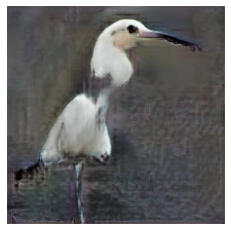

In [ ]:
with strategy.scope():
  label = 89
  fixed_noise = tf.random.truncated_normal((LATENT_DIM,), stddev=1)
  generated_image = sample_single_image(
      generator=generator,
      label=label,
      noise=fixed_noise
  )

In [ ]:
with strategy.scope():
  labels = tf.constant([label], dtype=tf.int64)
  images = tf.expand_dims(generated_image, axis=0)

  decision = discriminator(images, labels)
  print(decision)

tf.Tensor([[0.94806]], shape=(1, 1), dtype=float32)


In [ ]:
#@title train_step

train_step = make_distributed_train_step(
  generator=generator,
  discriminator=discriminator,
  discriminator_loss=discriminator_loss,
  generator_loss=generator_loss,
  generator_optimizer=generator_optimizer,
  discriminator_optimizer=discriminator_optimizer,
  batch_size=PER_REPILICA_BATCH_SIZE,
  latent_dim=LATENT_DIM,
  strategy=strategy
)

In [ ]:
train_iterator = iter(train_dataset)

for epoch in range(meta['epoch'], EPOCHS + 1):
  meta['epoch'] = epoch
  start = time.time()
  print('Epoch: {}/{}'.format(epoch, EPOCHS))

  pbar = tqdm(range(STEPS_PER_EPOCH))
  for step in pbar:
    disc_loss_real, disc_loss_fake, gen_loss = train_step(train_iterator)
    meta['history']['disc_loss_real'].append(float(disc_loss_real));
    meta['history']['disc_loss_fake'].append(float(disc_loss_fake));
    meta['history']['gen_loss'].append(float(gen_loss));
    pbar.set_postfix({
        'disc_loss_real': round(float(disc_loss_real), 4), 
        'disc_loss_fake': round(float(disc_loss_fake), 4), 
        'gen_loss': round(float(gen_loss), 4)
    })
    pbar.set_description("Current step %s" % generator_optimizer.iterations.numpy())
    
  if epoch % SAMPLE_INTERVAL == 0:
    with strategy.scope():
      generator_optimizer.swap_weights()
      sample_images(epoch = epoch, save=True, show=False)
      generator_optimizer.swap_weights()
    
  if epoch % CHECKPOINT_INTERVAL == 0:
    save_checkpoint()
    sample_analytics(meta, save=True, show=False)   

  print('Time for epoch {} is {} sec'.format(epoch, time.time()-start))

Epoch: 1/30


Current step 1657: 100%|██████████| 1657/1657 [09:42<00:00,  2.84it/s, disc_loss_real=0.0009, disc_loss_fake=0.0035, gen_loss=0.0157]


Time for epoch 1 is 596.3753333091736 sec
Epoch: 2/30


Current step 3314: 100%|██████████| 1657/1657 [06:30<00:00,  4.24it/s, disc_loss_real=0.0016, disc_loss_fake=0.0024, gen_loss=0.0193]


Time for epoch 2 is 402.08061122894287 sec
Epoch: 3/30


Current step 4971: 100%|██████████| 1657/1657 [06:30<00:00,  4.24it/s, disc_loss_real=0.0008, disc_loss_fake=0.0064, gen_loss=0.0128]


Time for epoch 3 is 404.02243542671204 sec
Epoch: 4/30


Current step 6628: 100%|██████████| 1657/1657 [06:30<00:00,  4.24it/s, disc_loss_real=0.0142, disc_loss_fake=0.0117, gen_loss=0.004]


Time for epoch 4 is 401.7088267803192 sec
Epoch: 5/30


Current step 8285: 100%|██████████| 1657/1657 [06:31<00:00,  4.24it/s, disc_loss_real=0.0004, disc_loss_fake=0.0004, gen_loss=0.0384]


Saving checkpoint
Time for epoch 5 is 407.760942697525 sec
Epoch: 6/30


Current step 9942: 100%|██████████| 1657/1657 [06:30<00:00,  4.24it/s, disc_loss_real=0.0019, disc_loss_fake=0.0003, gen_loss=0.0381]


Time for epoch 6 is 401.74103140830994 sec
Epoch: 7/30


Current step 11599: 100%|██████████| 1657/1657 [06:30<00:00,  4.24it/s, disc_loss_real=0.0014, disc_loss_fake=0.0001, gen_loss=0.0503]


Time for epoch 7 is 404.5346531867981 sec
Epoch: 8/30


Current step 13256: 100%|██████████| 1657/1657 [06:29<00:00,  4.26it/s, disc_loss_real=0.0026, disc_loss_fake=0.0001, gen_loss=0.0452]


Time for epoch 8 is 400.37123250961304 sec
Epoch: 9/30


Current step 14913: 100%|██████████| 1657/1657 [06:28<00:00,  4.26it/s, disc_loss_real=0, disc_loss_fake=0.0091, gen_loss=0.0159]


Time for epoch 9 is 399.666063785553 sec
Epoch: 10/30


Current step 16570: 100%|██████████| 1657/1657 [06:27<00:00,  4.27it/s, disc_loss_real=0.0006, disc_loss_fake=0.0116, gen_loss=0.0065]


Saving checkpoint
Time for epoch 10 is 402.3828101158142 sec
Epoch: 11/30


Current step 18227: 100%|██████████| 1657/1657 [06:27<00:00,  4.27it/s, disc_loss_real=0.0001, disc_loss_fake=0.0039, gen_loss=0.0211]


Time for epoch 11 is 399.9924063682556 sec
Epoch: 12/30


Current step 19884: 100%|██████████| 1657/1657 [06:29<00:00,  4.26it/s, disc_loss_real=0.0095, disc_loss_fake=0.0001, gen_loss=0.0424]


Time for epoch 12 is 399.650648355484 sec
Epoch: 13/30


Current step 21541: 100%|██████████| 1657/1657 [06:28<00:00,  4.27it/s, disc_loss_real=0.0051, disc_loss_fake=0.0001, gen_loss=0.041]


Time for epoch 13 is 399.6770098209381 sec
Epoch: 14/30


Current step 23198: 100%|██████████| 1657/1657 [06:30<00:00,  4.25it/s, disc_loss_real=0.0018, disc_loss_fake=0.0024, gen_loss=0.0302]


Time for epoch 14 is 401.46929907798767 sec
Epoch: 15/30


Current step 24855: 100%|██████████| 1657/1657 [06:30<00:00,  4.25it/s, disc_loss_real=0.0015, disc_loss_fake=0.0024, gen_loss=0.0301]


Saving checkpoint
Time for epoch 15 is 404.86960196495056 sec
Epoch: 16/30


Current step 26512: 100%|██████████| 1657/1657 [06:31<00:00,  4.24it/s, disc_loss_real=0.0009, disc_loss_fake=0.0046, gen_loss=0.0186]


Time for epoch 16 is 405.17798709869385 sec
Epoch: 17/30


Current step 28169: 100%|██████████| 1657/1657 [06:31<00:00,  4.24it/s, disc_loss_real=0.0025, disc_loss_fake=0.0042, gen_loss=0.0159]


Time for epoch 17 is 402.7980635166168 sec
Epoch: 18/30


Current step 29826: 100%|██████████| 1657/1657 [06:31<00:00,  4.23it/s, disc_loss_real=0.0082, disc_loss_fake=0.0003, gen_loss=0.0397]


Time for epoch 18 is 402.2039716243744 sec
Epoch: 19/30


Current step 31483: 100%|██████████| 1657/1657 [06:31<00:00,  4.24it/s, disc_loss_real=0.0017, disc_loss_fake=0.0021, gen_loss=0.0268]


Time for epoch 19 is 402.18615889549255 sec
Epoch: 20/30


Current step 33140: 100%|██████████| 1657/1657 [06:29<00:00,  4.26it/s, disc_loss_real=0.0015, disc_loss_fake=0.004, gen_loss=0.0209]


Saving checkpoint
Time for epoch 20 is 404.01244831085205 sec
Epoch: 21/30


Current step 34797: 100%|██████████| 1657/1657 [06:28<00:00,  4.26it/s, disc_loss_real=0.0016, disc_loss_fake=0.0016, gen_loss=0.0333]


Time for epoch 21 is 399.9995810985565 sec
Epoch: 22/30


Current step 36454: 100%|██████████| 1657/1657 [06:28<00:00,  4.27it/s, disc_loss_real=0.0017, disc_loss_fake=0.0036, gen_loss=0.0222]


Time for epoch 22 is 402.0651602745056 sec
Epoch: 23/30


Current step 38111: 100%|██████████| 1657/1657 [06:28<00:00,  4.27it/s, disc_loss_real=0.0009, disc_loss_fake=0.0011, gen_loss=0.0305]


Time for epoch 23 is 398.91343426704407 sec
Epoch: 24/30


Current step 39768: 100%|██████████| 1657/1657 [06:28<00:00,  4.27it/s, disc_loss_real=0.0001, disc_loss_fake=0.0019, gen_loss=0.027]


Time for epoch 24 is 399.17075991630554 sec
Epoch: 25/30


Current step 41425: 100%|██████████| 1657/1657 [06:28<00:00,  4.26it/s, disc_loss_real=0.0031, disc_loss_fake=0.0026, gen_loss=0.0303]


Saving checkpoint
Time for epoch 25 is 404.57988476753235 sec
Epoch: 26/30


Current step 43082: 100%|██████████| 1657/1657 [06:30<00:00,  4.24it/s, disc_loss_real=0.0029, disc_loss_fake=0.0022, gen_loss=0.0275]


Time for epoch 26 is 402.28284525871277 sec
Epoch: 27/30


Current step 44739: 100%|██████████| 1657/1657 [06:29<00:00,  4.25it/s, disc_loss_real=0.0009, disc_loss_fake=0.005, gen_loss=0.0228]


Time for epoch 27 is 400.7246217727661 sec
Epoch: 28/30


Current step 46396: 100%|██████████| 1657/1657 [06:29<00:00,  4.26it/s, disc_loss_real=0.0051, disc_loss_fake=0.0011, gen_loss=0.0347]


Time for epoch 28 is 400.58147144317627 sec
Epoch: 29/30


Current step 48053: 100%|██████████| 1657/1657 [06:29<00:00,  4.25it/s, disc_loss_real=0.0004, disc_loss_fake=0.0029, gen_loss=0.0255]


Time for epoch 29 is 400.8903102874756 sec
Epoch: 30/30


Current step 49710: 100%|██████████| 1657/1657 [06:29<00:00,  4.26it/s, disc_loss_real=0.0017, disc_loss_fake=0.0013, gen_loss=0.0334]


Saving checkpoint
Time for epoch 30 is 407.0555057525635 sec


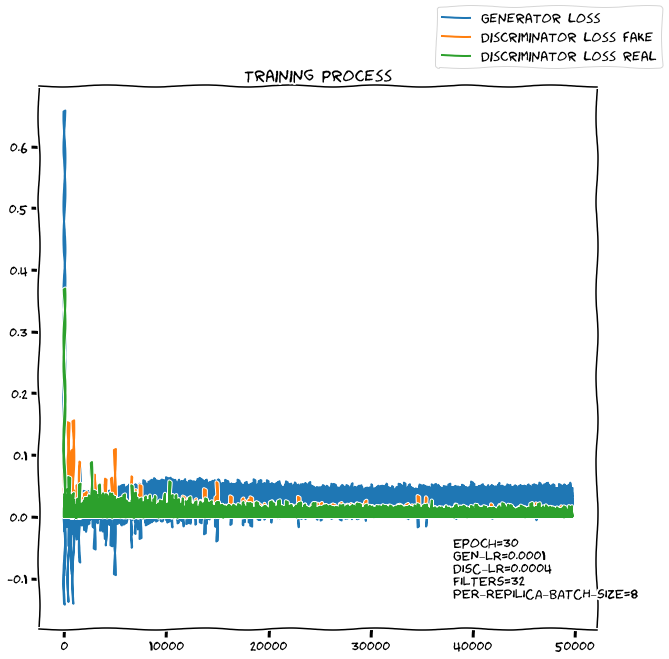

In [ ]:
sample_analytics(meta, save=False, show=True)    

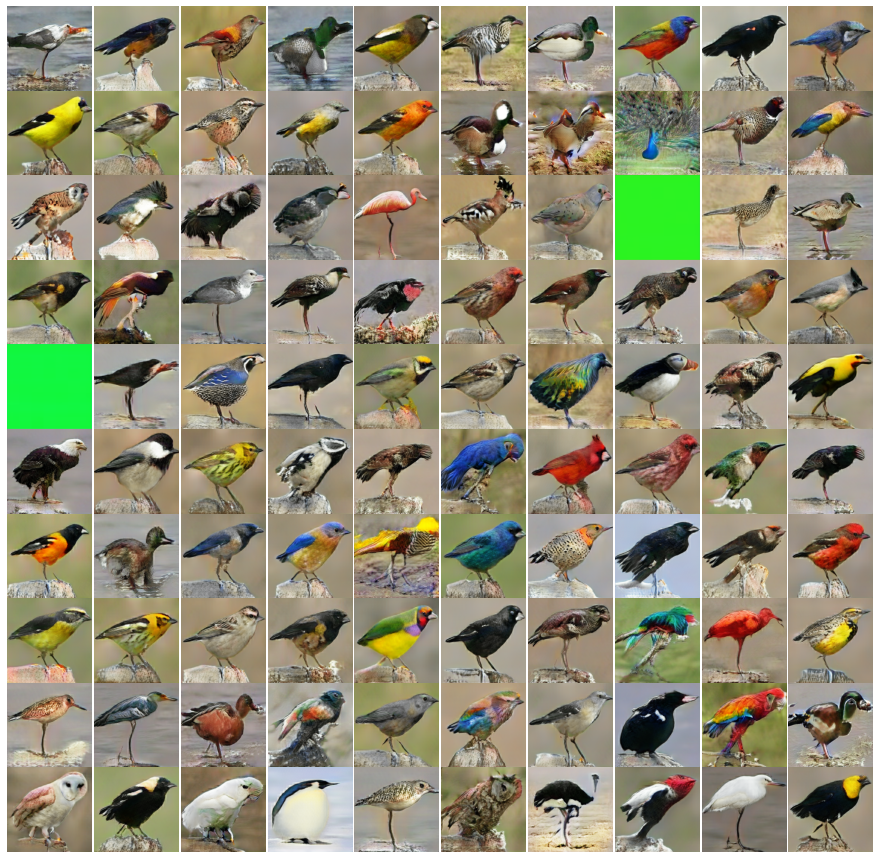

In [ ]:
with strategy.scope():
  generator_optimizer.swap_weights()
  sample_images(epoch = meta['epoch'], save=False, show=True, noise = fixed_noise)
  generator_optimizer.swap_weights()

(1, 224, 224, 3)


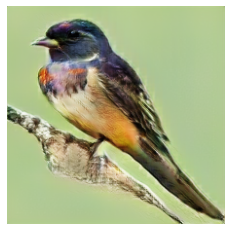

In [ ]:
with strategy.scope():
  generator_optimizer.swap_weights()
  generated_image = sample_single_image(
      generator=generator,
      label=10,
      noise=tf.random.truncated_normal((LATENT_DIM,), stddev=1)
  )
  generator_optimizer.swap_weights()

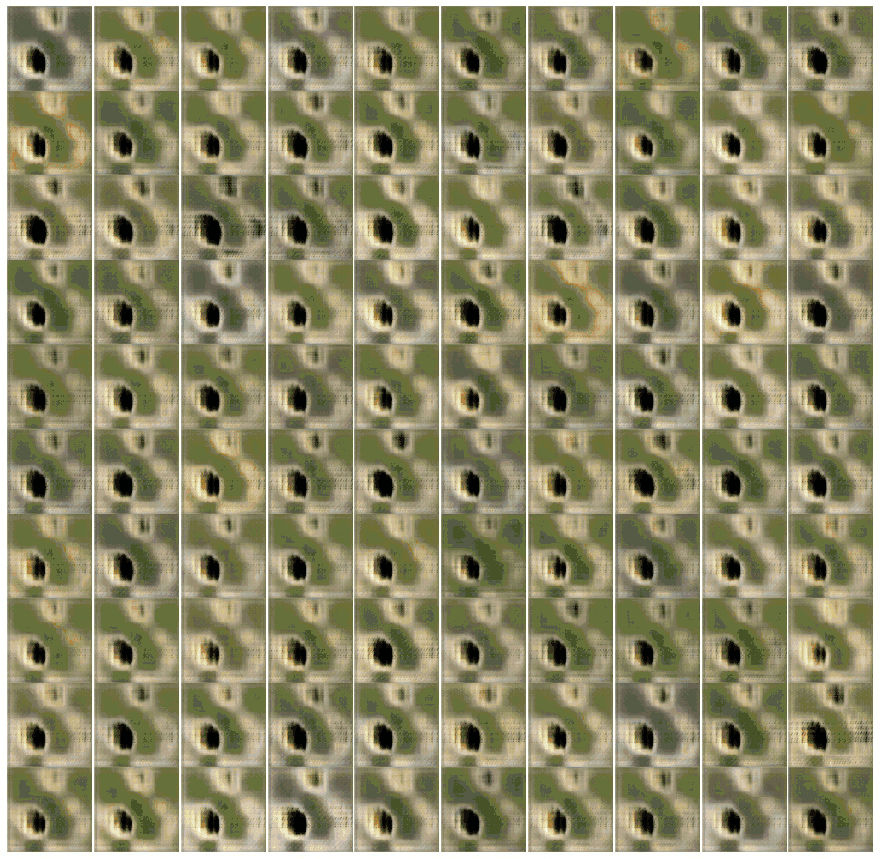

In [ ]:
combine_samples(SAMPLES_DIR, 'image_at_epoch_*.jpeg')